In [1]:
import os
os.chdir('C:/Users/Admin/hipython/OBJDECT')
print(f"현재 작업 디렉토리: {os.getcwd()}")


현재 작업 디렉토리: C:\Users\Admin\hipython\OBJDECT


In [2]:
import ultralytics

ultralytics.checks()# 버전 사용환경

Ultralytics 8.4.31  Python-3.11.15 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Setup complete  (16 CPUs, 31.7 GB RAM, 156.6/475.9 GB disk)


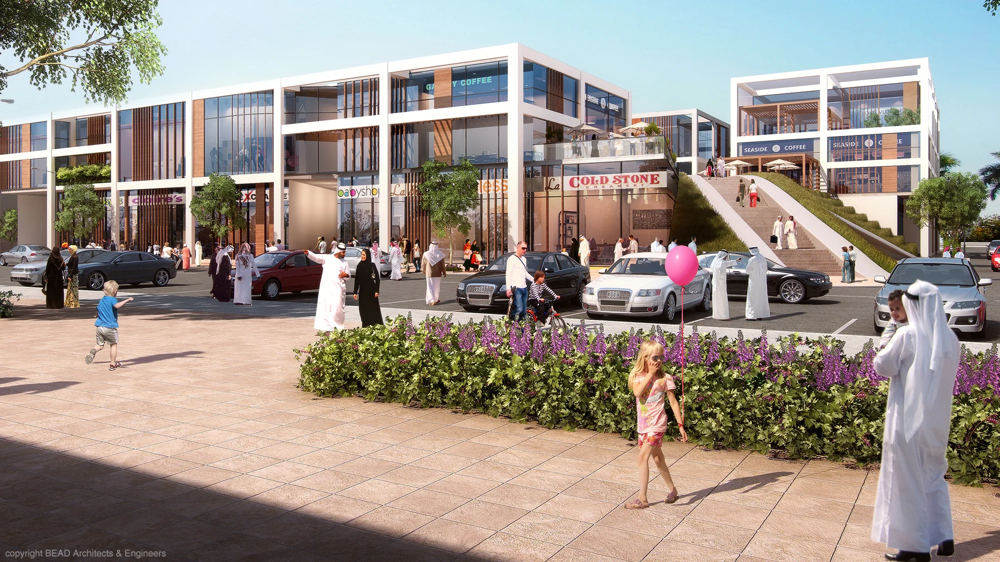

In [3]:
from PIL import Image # Pillow
from IPython.display import display

output_file = "street2.jpg"

with Image.open(output_file) as test_image:
    display(test_image)

In [4]:
from ultralytics import YOLO

# MS COCO 데이터셋 사전학습된 yolov8 모델 로드함
model = YOLO('yolov8n.pt')

In [5]:
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 80
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell p

In [6]:
results = model.predict(source='*.jpg', save=True, project='C:/Users/Admin/hipython/OBJDECT/runs/detect', name='predict')



image 1/6 C:\Users\Admin\hipython\OBJDECT\desktop.jpg: 448x640 3 zebras, 1 giraffe, 40.7ms
image 2/6 C:\Users\Admin\hipython\OBJDECT\sample.jpg: 512x640 3 persons, 35.0ms
WARNING Image Read Error C:\Users\Admin\hipython\OBJDECT\sample1.jpg
image 4/6 C:\Users\Admin\hipython\OBJDECT\sample2.jpg: 320x640 3 persons, 40.6ms
image 5/6 C:\Users\Admin\hipython\OBJDECT\sample3.jpg: 448x640 3 persons, 6.8ms
image 6/6 C:\Users\Admin\hipython\OBJDECT\street2.jpg: 384x640 13 persons, 12 cars, 39.8ms
Speed: 1.8ms preprocess, 32.6ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to C:\Users\Admin\hipython\OBJDECT\runs\detect\predict3


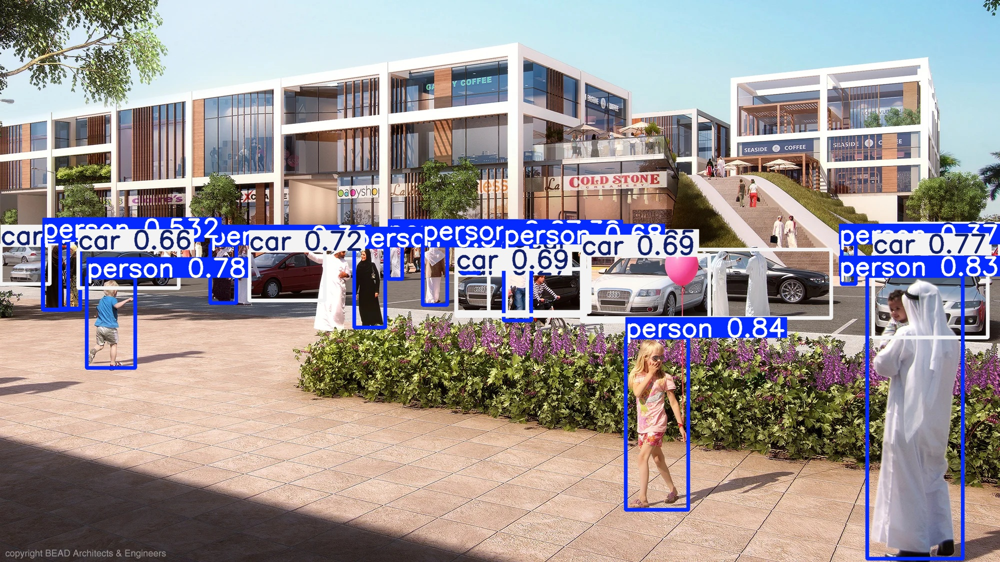

In [7]:
from PIL import Image
from IPython.display import display

# predict 결과 경로 확인 후 표시
import os
pred_path = 'C:/Users/Admin/hipython/OBJDECT/runs/detect/predict2/' + output_file

if os.path.exists(pred_path):
    with Image.open(pred_path) as pred_image:
        display(pred_image)
else:
    print(f"[!] {pred_path} 파일이 없습니다.")
    # predict를 다시 실행해야 할 수 있습니다
    print("위의 model.predict() 셀을 다시 실행해 주세요.")


In [8]:
import numpy as np

for result in results:

    uniq, cnt = np.unique(result.boxes.cls.cpu().numpy(), return_counts=True)  # Torch.Tensor -> numpy
    uniq_cnt_dict = dict(zip(uniq, cnt))

    print('\n{class num:counts} =', uniq_cnt_dict,'\n')

    for c in result.boxes.cls:
        print('class num =', int(c), ', class_name =', model.names[int(c)])


{class num:counts} = {np.float32(22.0): np.int64(3), np.float32(23.0): np.int64(1)} 

class num = 23 , class_name = giraffe
class num = 22 , class_name = zebra
class num = 22 , class_name = zebra
class num = 22 , class_name = zebra

{class num:counts} = {np.float32(0.0): np.int64(3)} 

class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person

{class num:counts} = {np.float32(0.0): np.int64(3)} 

class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person

{class num:counts} = {np.float32(0.0): np.int64(3)} 

class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person

{class num:counts} = {np.float32(0.0): np.int64(13), np.float32(2.0): np.int64(12)} 

class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 0 , class_name = person
class num = 2 , class_name = car
class num = 2 , class_name = car
class num = 2 , c

In [9]:
from ultralytics import YOLO

model = YOLO('yolov8n-seg.pt')
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 80
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell p

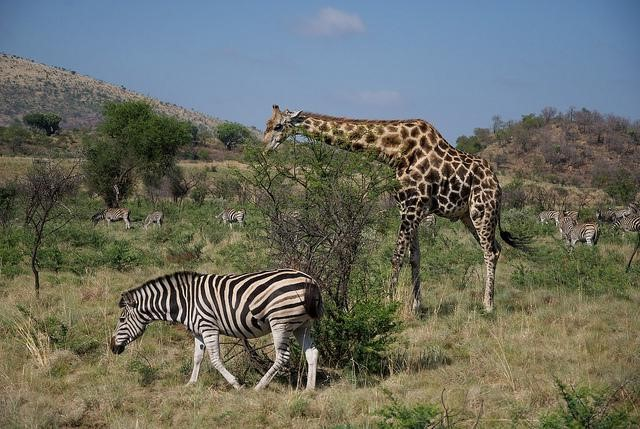

In [10]:
from PIL import Image
from IPython.display import display

# 이미지 파일을 열고
with Image.open('desktop.jpg') as test_image1:
    # 이미지를 display 함수를 사용하여 표시합니다.
    display(test_image1)

In [11]:
results = model.predict(source='desktop.jpg', save=True)


image 1/1 C:\Users\Admin\hipython\OBJDECT\desktop.jpg: 448x640 5 zebras, 1 giraffe, 25.7ms
Speed: 2.2ms preprocess, 25.7ms inference, 21.1ms postprocess per image at shape (1, 3, 448, 640)
Results saved to C:\Users\Admin\runs\segment\predict3


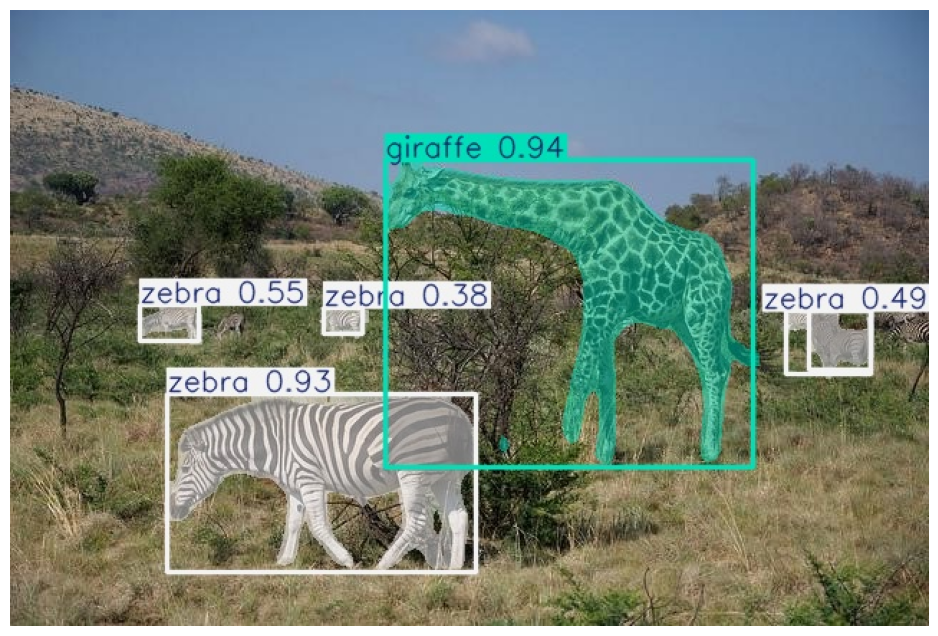

In [13]:
import cv2
import matplotlib.pyplot as plt

result_img = cv2.imread("C:/Users/Admin/runs/segment/predict3/desktop.jpg")

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
